# scATAC Integrate CCA

scRNA + scATAC integrate to generate CCA coembedding.

1. scATAC `metadata.tsv` with UMAP/densMAP coordinates and total fragments/insertions.
2. Single-cell counts matrix derived from snapATAC with corresponding peaks.
3. scRNA Seurat rds
4. ArchR Gene Scores

In [1]:
library(Matrix)
library(ggplot2)
library(patchwork)
library(GenomicRanges)
library(scales)
library(RColorBrewer)
library(DESeq2)
library(rtracklayer)
library(Seurat)

Loading required package: stats4

Loading required package: BiocGenerics

Loading required package: parallel


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


The following object is masked from ‘package:Matrix’:

    which


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, Map, mapply, match, mget,
    order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,
    rbind, Reduce, rownames, sapply, setdiff, sort, table, tapply,
    union, unique, unsplit, which, which.max, which.min


Loading

In [2]:
DAYS = c("D0", "D2", "D4", "D6", "D8", "D10", "D12", "D14", "iPSC")

## Loading Inputs

### MetaData

In [3]:
# should contain, sample_barcode as rowname, sample, umap1, umap2, cluster
metaData = read.table("../20200206_pmat_snapATAC/sessions/20210717_n62599/metadata.tsv", header = T)
rownames(metaData) = paste(metaData$sample, metaData$barcode, sep='_')
metaData$cells = rownames(metaData) # for cicero
metaData$sample = factor(metaData$sample, levels=DAYS)
dim(metaData)
head(metaData, 5)

[1] 62599     6

,barcode,sample,umap1,umap2,cluster,cells
,<fct>,<fct>,<dbl>,<dbl>,<int>,<chr>
D0_AAACACGCTAGTACGG,AAACACGCTAGTACGG,D0,-1.8037916,-9.507773,1,D0_AAACACGCTAGTACGG
D0_AAACACGCTCTTCAAG,AAACACGCTCTTCAAG,D0,0.7074551,-9.406457,1,D0_AAACACGCTCTTCAAG
D0_AAACACGCTGATCCAT,AAACACGCTGATCCAT,D0,-2.9559933,-7.641148,1,D0_AAACACGCTGATCCAT
D0_AAACCCTGACCGCTAG,AAACCCTGACCGCTAG,D0,-3.6119107,-8.443144,1,D0_AAACCCTGACCGCTAG
D0_AAACCCTGATTGCAGT,AAACCCTGATTGCAGT,D0,0.5002119,-8.759449,3,D0_AAACCCTGATTGCAGT


In [4]:
cluster_config = read.table("../../figures_factory/configs/cluster.tsv", comment.char = '', sep='\t', header=T)
cluster_config

cluster,colour,description,new_cluster
<int>,<fct>,<fct>,<int>
1,#B03743,Fibroblast,1
2,#E85F6D,Fibroblast-like,3
3,#7C2730,Fibroblast-like,2
4,#F0A118,Intermediate,12
5,#78A824,Pre-iPSC,13
6,#A6D854,Pre-iPSC,14
7,#F01D35,Fibroblast-like,5
8,#13C4A3,iPSC,15
9,#406614,Partially-reprogrammed,10


In [5]:
day_config = read.table("../../figures_factory/configs/day.tsv", comment.char = '', header=T)
day_config$colour = as.character(day_config$colour)
day_config$day = factor(day_config$day, levels=DAYS)
rownames(day_config) = day_config$day
day_config

,day,colour
,<fct>,<chr>
D0,D0,#A61C24
D2,D2,#FF70A6
D4,D4,#D6E82F
D6,D6,#B14AED
D8,D8,#2D3142
D10,D10,#FC7753
D12,D12,#0AABB7
D14,D14,#336699
iPSC,iPSC,#13C4A3


### Features

In [7]:
atac.feats = read.table("../20200206_pmat_snapATAC/sessions/20210717_n62599/features.10d.tsv", sep='\t', header=T)
rownames(atac.feats) = atac.feats$sample_barcode
atac.feats$sample_barcode = NULL
head(atac.feats)

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
D0_AAACACGCTAGTACGG,-0.011152076,0.004344354,0.0002529584,0.008401771,8.648427e-03,0.010894021,-0.0094426710,0.007332589,-0.0010194442,0.004179675
D0_AAACACGCTCTTCAAG,-0.009687992,0.003813404,-0.0019580142,0.002899934,6.726516e-03,0.021007651,-0.0007418293,0.004306952,0.0009223041,0.002109996
D0_AAACACGCTGATCCAT,-0.010974599,0.003615655,0.0003501312,0.004525435,1.075582e-03,0.001667028,-0.0094977661,0.004310447,-0.0050801545,0.004722692
D0_AAACCCTGACCGCTAG,-0.014855187,0.004356973,0.0036240332,0.007491073,-6.718933e-05,0.003827929,-0.0135600675,0.006657502,0.0011535875,0.009558255
D0_AAACCCTGATTGCAGT,-0.012246358,0.004827133,0.0014392929,0.005282205,8.118169e-03,0.015956554,-0.0007619940,-0.004423390,0.0028289789,0.004031496
D0_AAACCGTACACACCTA,-0.011420356,0.003894420,0.0005670868,0.005529925,5.635302e-03,0.010567579,-0.0081736948,0.004575552,-0.0008645562,0.006031409


### Seurat Object

In [8]:
library(Seurat)

In [9]:
rna = readRDS("./sessions/20210725_n59378/seurat.rds")
rna$tech = "rna"

## ArchR Gene Score

In [ ]:
library(ArchR)

In [11]:
addArchRThreads(threads = 32) 

Setting default number of Parallel threads to 32.



In [12]:
addArchRGenome("hg38")

Setting default genome to Hg38.



In [13]:
ArrowFiles = c('D0.arrow',
               'D2.arrow',
               'D4.arrow',
               'D6.arrow',
               'D8.arrow',
               'D10.arrow',
               'D12.arrow',
               'D14.arrow',
               'iPSC.arrow')

In [14]:
archr_proj <- ArchRProject(
  ArrowFiles = paste("/srv/scratch/surag/scATAC-reprog/arrow/", ArrowFiles, sep=''), 
  outputDirectory = "./tmp/",
  copyArrows = FALSE #This is recommened so that you maintain an unaltered copy for later usage.
)

Using GeneAnnotation set by addArchRGenome(Hg38)!

Using GeneAnnotation set by addArchRGenome(Hg38)!

Validating Arrows...

Getting SampleNames...



Getting Cell Metadata...



Merging Cell Metadata...

Initializing ArchRProject...


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,-

In [15]:
all(paste(metaData$sample, metaData$barcode, sep='#') %in% archr_proj$cellNames)

[1] TRUE

In [16]:
# subset to cells
archr_proj = archr_proj[paste(metaData$sample, metaData$barcode, sep='#'), ]

In [17]:
getAvailableMatrices(archr_proj)

[1] "GeneIntegrationMatrix" "GeneScoreMatrix"       "PeakMatrix"           
[4] "TileMatrix"

In [18]:
archr_gene_score = getMatrixFromProject(archr_proj, "GeneScoreMatrix")
dim(archr_gene_score)

ArchR logging to : ArchRLogs/ArchR-getMatrixFromProject-2f8ec62b146e23-Date-2021-09-29_Time-06-40-16.log
If there is an issue, please report to github with logFile!

2021-09-29 06:41:42 : Organizing colData, 1.427 mins elapsed.

2021-09-29 06:41:42 : Organizing rowData, 1.43 mins elapsed.

2021-09-29 06:41:42 : Organizing rowRanges, 1.43 mins elapsed.

2021-09-29 06:41:42 : Organizing Assays (1 of 1), 1.43 mins elapsed.

2021-09-29 06:42:52 : Constructing SummarizedExperiment, 2.599 mins elapsed.

2021-09-29 06:42:54 : Finished Matrix Creation, 2.629 mins elapsed.



[1] 24919 62599

In [19]:
archr_gene_score_mat = archr_gene_score@assays@data$GeneScoreMatrix
rownames(archr_gene_score_mat) = rowData(archr_gene_score)$name
colnames(archr_gene_score_mat) = sub("#", "_", rownames(colData(archr_gene_score)))
# reorder
archr_gene_score_mat = archr_gene_score_mat[, rownames(metaData)]

In [20]:
# reclaim some memory
rm(archr_gene_score)
gc()

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,8537298,456.0,15598694,833.1,12212630,652.3
Vcells,3286457136,25073.7,7201474966,54942.9,6533569474,49847.2


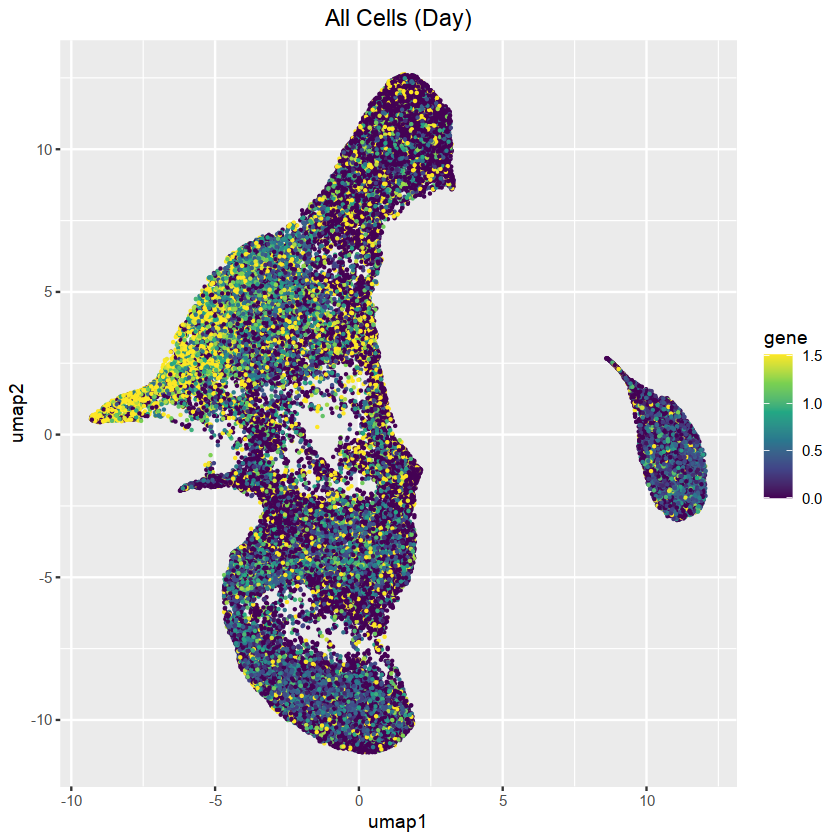

In [21]:
options(repr.plot.width = 7, repr.plot.height = 7)

cur_gene = as.numeric(archr_gene_score_mat["MAP2",])
df = data.frame(metaData, gene=cur_gene)
# shuffle so days don't overlap
df = df[sample(dim(df)[1]), ]

ggplot(df) +
# ggplot(df[df$x.sp.sample %in% c("D14"), ]) +
geom_point(size=0.2, alpha=1, aes(x=umap1 , y=umap2, col=gene)) +
# scale_color_brewer(breaks=DAYS, palette = "Set1") +
ggtitle("All Cells (Day)") + 
scale_color_viridis_c(limits=c(quantile(cur_gene, .1),
                               quantile(cur_gene, .9)), oob=squish) +
theme(plot.title = element_text(hjust = 0.5)) 
# guides(colour = guide_legend(override.aes = list(shape=16, alpha=1, size=4))) 

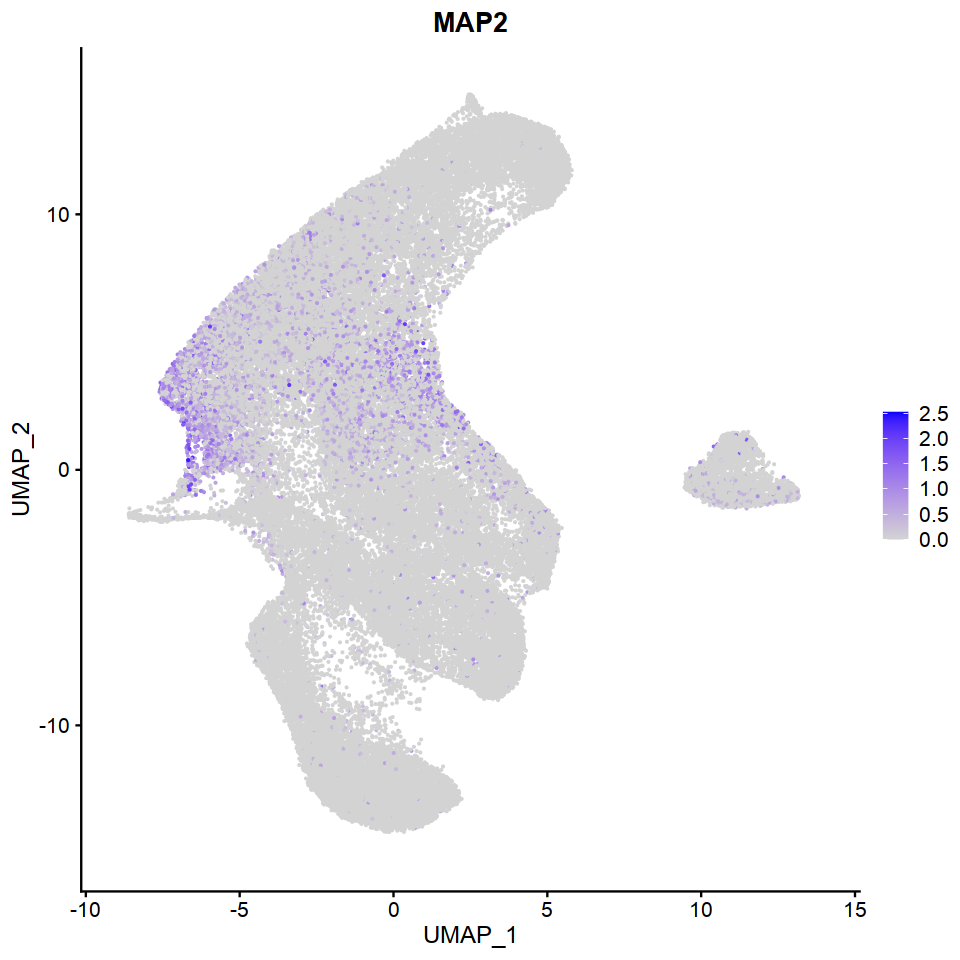

In [22]:
options(repr.plot.width = 8, repr.plot.height = 8)

FeaturePlot(rna, features = c("MAP2"), reduction = "umap", pt.size = 0.1, combine = FALSE)[[1]]

In [23]:
gc()

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,8643419,461.7,15598694,833.1,12212630,652.3
Vcells,3287482080,25081.5,7201474966,54942.9,6533569474,49847.2


## Integration

In [24]:
# atac.seurat = CreateSeuratObject(counts = raw_gene_score, assay = "ACTIVITY", project="scATAC")
atac.seurat = CreateSeuratObject(counts = archr_gene_score_mat, assay = "ACTIVITY", project="scATAC")
atac.seurat[['clusters']] = factor(as.numeric(metaData$cluster))
atac.seurat[['clusters_new_id']] = factor(cluster_config[as.numeric(metaData$cluster), "new_cluster"])
atac.seurat$tech <- "atac"

atac.seurat <- FindVariableFeatures(atac.seurat)
atac.seurat <- NormalizeData(atac.seurat)
atac.seurat <- ScaleData(atac.seurat)

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Centering and scaling data matrix



In [25]:
common_var_genes = VariableFeatures(object = rna)[VariableFeatures(object = rna) %in% rownames(archr_gene_score_mat)]
length(common_var_genes)

[1] 1775

## Coembed

In [26]:
transfer.anchors <- FindTransferAnchors(reference = rna, query = atac.seurat, features = common_var_genes, 
    reference.assay = "RNA", query.assay = "ACTIVITY", reduction = "cca")

Warning message in RunCCA.Seurat(object1 = reference, object2 = query, features = features, :
“Running CCA on different assays”
Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 86983 anchors

Filtering anchors

	Retained 4061 anchors

Extracting within-dataset neighbors



In [27]:
transfer.anchors

An AnchorSet object containing 4061 anchors between 1 Seurat objects 
 This can be used as input to IntegrateData or TransferData.

In [28]:
# trying to use precomputed feats
atac.seurat[["ATAC"]] <- CreateAssayObject(counts = t(atac.feats))
DefaultAssay(atac.seurat) <- "ATAC"

In [29]:
atac.seurat@reductions$diffmap = CreateDimReducObject(embeddings=as.matrix(atac.feats), 
                                           loadings=matrix(, nrow = 0, ncol = 0),
                                           key="diffmap",
                                           assay="ATAC")

Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from diffmap to diffmap_”
Warning message:
“All keys should be one or more alphanumeric characters followed by an underscore '_', setting key to diffmap_”


In [30]:
atac.seurat@reductions$umap = CreateDimReducObject(embeddings=as.matrix(metaData[,c("umap1", "umap2")]),
                                                  loadings=matrix(,nrow=0,ncol=0),
                                                  key="umap",
                                                  assay="ATAC")

Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from umap to umap_”
Warning message:
“All keys should be one or more alphanumeric characters followed by an underscore '_', setting key to umap_”


In [31]:
celltype.predictions <- TransferData(anchorset = transfer.anchors, refdata = rna$seurat_clusters, 
                            weight.reduction = "cca")          
                       #    weight.reduction = atac.seurat[["diffmap"]], dims=1:9)

Finding integration vectors

Finding integration vector weights

Predicting cell labels



In [32]:
atac.seurat <- AddMetaData(atac.seurat, metadata = celltype.predictions)

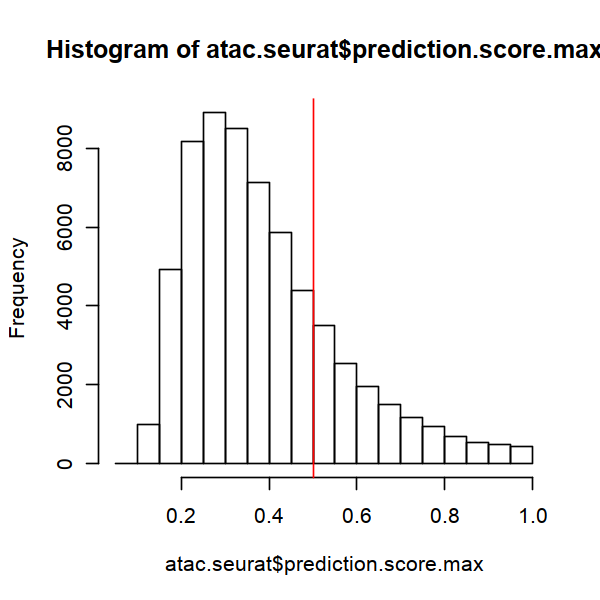

In [33]:
options(repr.plot.width = 5, repr.plot.height = 5)

hist(atac.seurat$prediction.score.max)
abline(v = 0.5, col = "red")

In [34]:
cxc_cor_mat = cor(celltype.predictions[, paste("prediction.score", sort(unique(rna$seurat_clusters)), sep=".")])

Warning message in melt(cxc_cor_mat):
“The melt generic in data.table has been passed a matrix and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is deprecated, and this redirection is now deprecated as well. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace like reshape2::melt(cxc_cor_mat). In the next version, this warning will become an error.”


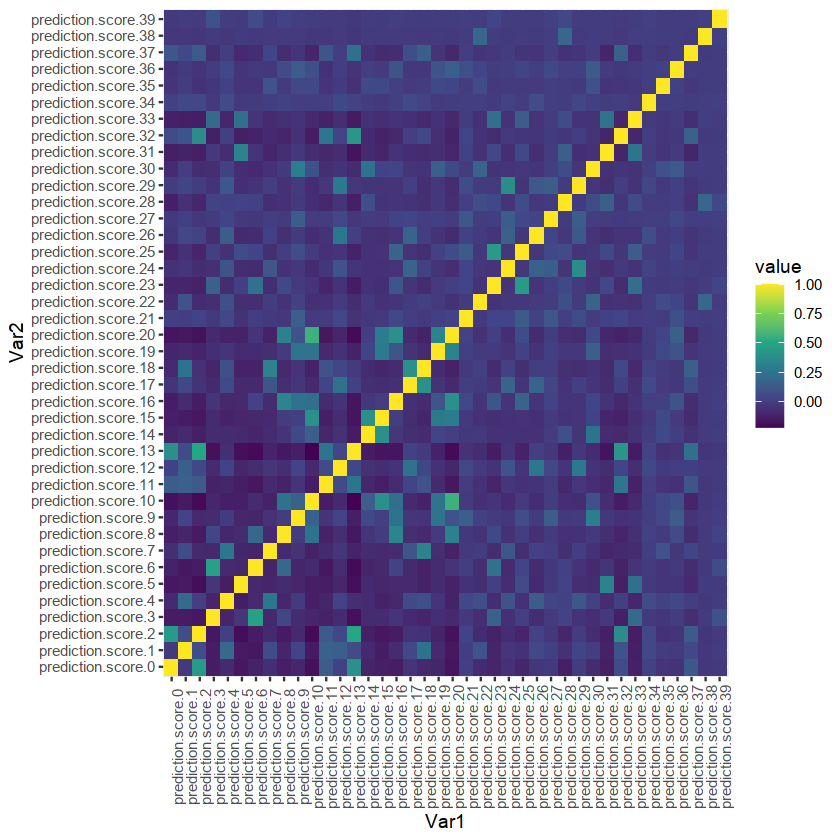

In [35]:
options(repr.plot.width = 7, repr.plot.height = 7)

ggplot(melt(cxc_cor_mat)) +
geom_tile(aes(x=Var1,y=Var2,fill=value)) +
scale_fill_viridis_c() +
theme(axis.text.x = element_text(angle = 90))

Warning message:
“Using `as.character()` on a quosure is deprecated as of rlang 0.3.0.
Please use `as_label()` or `as_name()` instead.
This warning is displayed once per session.”


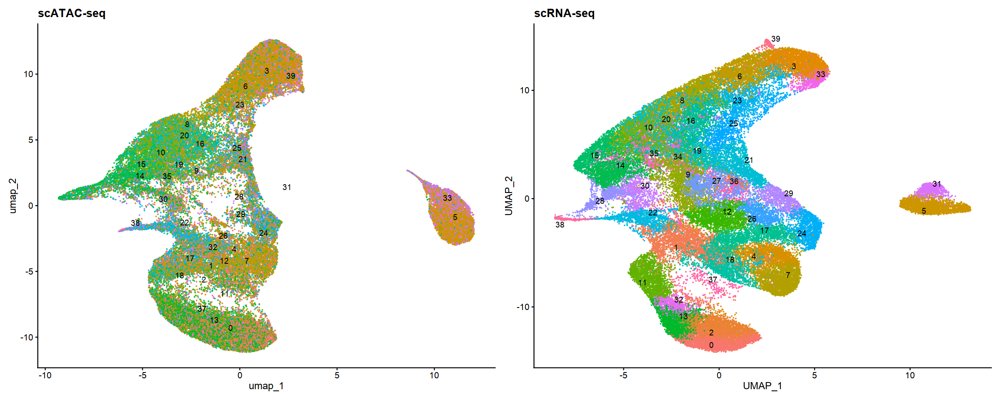

In [36]:
options(repr.plot.width = 20, repr.plot.height = 8)

atac.seurat$predicted.id <- factor(atac.seurat$predicted.id, levels = levels(rna))  # to make the colors match
p1 <- DimPlot(atac.seurat, group.by="predicted.id", label=T, repel=T) + NoLegend() + ggtitle("scATAC-seq") + scale_colour_hue(drop = FALSE)
p2 <- DimPlot(rna, group.by = "seurat_clusters", label = TRUE, repel = TRUE) + NoLegend() + ggtitle("scRNA-seq")
p1 + p2

In [37]:
# This method first imputes RNA for ATAC cells and then performs reduction on the actual + imputed
# Trying this gives somewhat misaligned clusters and not great mixing
# Try the CCA + harmony approach instead (below)

# note that we restrict the imputation to variable genes from scRNA-seq, but could impute the
# full transcriptome if we wanted to
genes.use <- VariableFeatures(rna)
refdata <- GetAssayData(rna, assay = "RNA", slot = "data")[genes.use, ]

# refdata (input) contains a scRNA-seq expression matrix for the scRNA-seq cells.  imputation
# (output) will contain an imputed scRNA-seq matrix for each of the ATAC cells
imputation <- TransferData(anchorset = transfer.anchors, refdata = refdata, 
#                            weight.reduction = "cca") 
                           weight.reduction = atac.seurat[["diffmap"]], dims=1:8)

# this line adds the imputed data matrix to the pbmc.atac object
atac.seurat[["RNA"]] <- imputation
coembed <- merge(x = rna, y = atac.seurat)

# Finally, we run PCA and UMAP on this combined object, to visualize the co-embedding of both
# datasets
coembed <- ScaleData(coembed, features = genes.use, do.scale = FALSE)
coembed <- RunPCA(coembed, features = genes.use, verbose = FALSE)
coembed <- RunUMAP(coembed, dims = 1:30)
coembed$celltype <- ifelse(!is.na(coembed$seurat_clusters), coembed$seurat_clusters, coembed$predicted.id)

Finding integration vectors

Finding integration vector weights

Transfering 2000 features onto reference data

Centering data matrix

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
08:28:14 UMAP embedding parameters a = 0.9922 b = 1.112

08:28:14 Read 121977 rows and found 30 numeric columns

08:28:14 Using Annoy for neighbor search, n_neighbors = 30

08:28:14 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

|

08:28:40 Writing NN index file to temp file /tmp/Rtmp3iUyo6/file2f8ec672ec20a0

08:28:40 Searching Annoy index using 1 thread, 

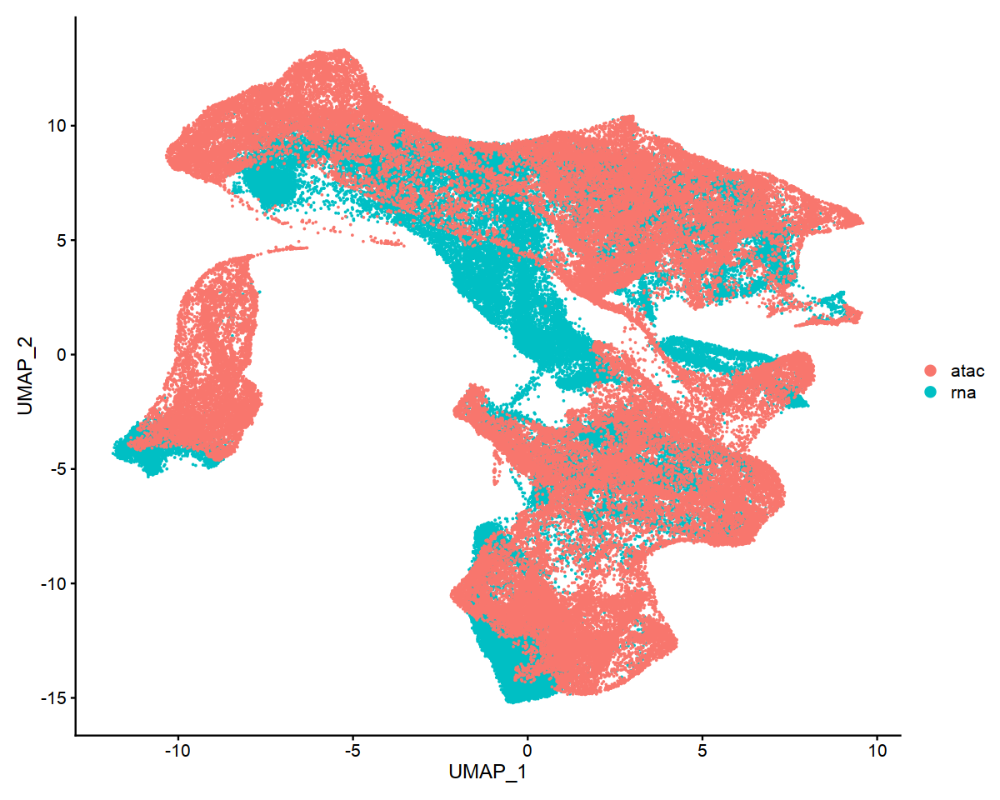

In [41]:
options(repr.plot.width = 10, repr.plot.height = 8)

DimPlot(coembed, group.by = c("tech"))

### Use CCA For Coembedding

In [95]:
cca_mat = as.matrix(transfer.anchors@object.list[[1]]@reductions$cca.l2@cell.embeddings)
rnames = rownames(cca_mat)
rnames = sub("_reference", "", rnames)
rnames = sub("_query", "", rnames)
all(rnames == colnames(coembed))
rownames(cca_mat) = rnames

coembed@reductions$cca = CreateDimReducObject(embeddings=cca_mat, 
                                           loadings=matrix(, nrow = 0, ncol = 0),
                                           key="cca",
                                           assay="ATAC")

[1] TRUE

Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from cca to cca_”
Warning message:
“All keys should be one or more alphanumeric characters followed by an underscore '_', setting key to cca_”


In [99]:
coembed <- RunUMAP(coembed, reduction = "cca", dims = 1:30)

09:34:14 UMAP embedding parameters a = 0.9922 b = 1.112

09:34:14 Read 121977 rows and found 30 numeric columns

09:34:14 Using Annoy for neighbor search, n_neighbors = 30

09:34:14 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

|

09:34:39 Writing NN index file to temp file /tmp/Rtmp3iUyo6/file2f8ec62a5d6727

09:34:39 Searching Annoy index using 1 thread, search_k = 3000

09:35:57 Annoy recall = 100%

09:35:58 Commencing smooth kNN distance calibration using 1 thread

09:36:06 Initializing from normalized Laplacian + noise

09:36:12 Commencing optimization for 200 epochs, with 5598984 positive edges

09:37:39 Optimization finished



In [100]:
plot_dimred <- function(x, y, col, dimred="UMAP", subset=NULL, sz=0.5) {
    plot_df <- data.frame(x=x, y=y,
                 cluster=col)
    plot_df = plot_df[sample(dim(plot_df)[1]), ]
    
    if (!is.null(subset)) {
        plot_df = plot_df[plot_df$cluster==subset, ]
    }
    
    ggplot(plot_df) +
    geom_point(aes(x=x, y=y, color=cluster), stroke=0, size=sz) +
    theme_classic() +
    xlab(sprintf("%s 1", dimred)) + ylab(sprintf("%s 2", dimred)) +
    theme(plot.title = element_text(hjust = 0.5),
          text = element_text(size=12),
          axis.line=element_blank(),
          axis.text.x=element_blank(),
          axis.text.y=element_blank(),
          axis.ticks=element_blank(),
          panel.border = element_rect(colour = "black", fill=NA, size=0.5)) +
    guides(colour = guide_legend(title="Day",
         override.aes = list(shape=16, alpha=1, size=4)))
}

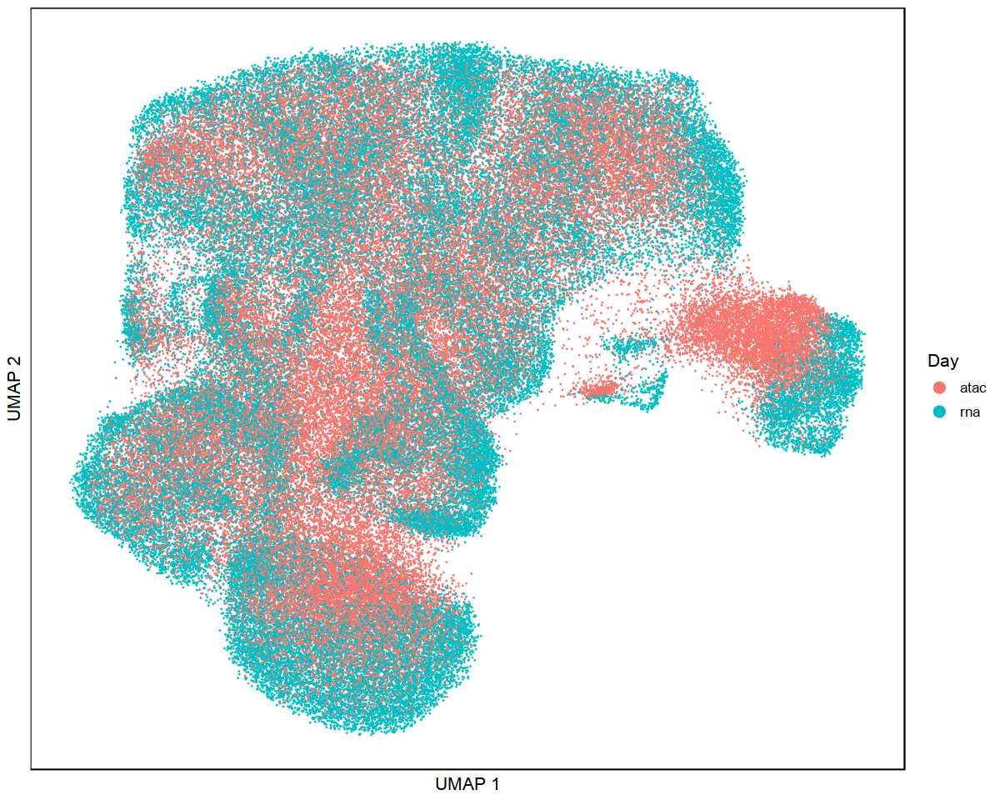

In [103]:
options(repr.plot.width = 10, repr.plot.height = 8)

plot_dimred(data.frame(Embeddings(coembed, reduction='umap'))$UMAP_1,
            -data.frame(Embeddings(coembed, reduction='umap'))$UMAP_2,
            coembed@meta.data$tech)

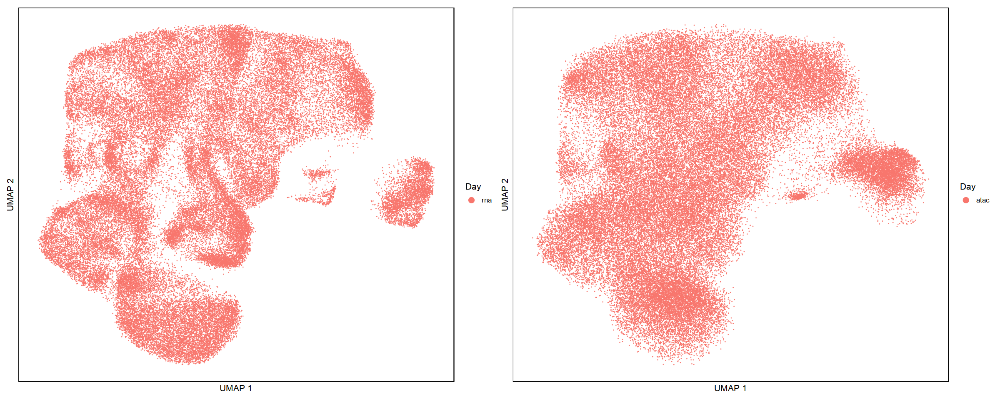

In [104]:
options(repr.plot.width = 20, repr.plot.height = 8)

plot_dimred(data.frame(Embeddings(coembed, reduction='umap'))$UMAP_1,
            -data.frame(Embeddings(coembed, reduction='umap'))$UMAP_2,
            coembed@meta.data$tech, subset="rna") | 
plot_dimred(data.frame(Embeddings(coembed, reduction='umap'))$UMAP_1,
            -data.frame(Embeddings(coembed, reduction='umap'))$UMAP_2,
            coembed@meta.data$tech, subset="atac")

In [51]:
# coembed <- FindNeighbors(coembed, dims = 1:30) # kNN from PCA
# coembed <- FindClusters(coembed, resolution = .5)

In [52]:
# kNN from CCA
# coembed = FindNeighbors(coembed, reduction = "cca", dims = 1:30, nn.eps = 1)

In [53]:
# o = (coembed@graphs$RNA_nn %*% ifelse(coembed$tech=="rna", 1, 0)) # computed from imputed RNA
# o = (coembed@graphs$ATAC_nn %*% ifelse(coembed$tech=="rna", 1, 0)) # from CCA

In [54]:
# fraction of kNN for RNA and ATAC that are the same type
# options(repr.plot.width = 10, repr.plot.height = 5)

# hist((o[coembed$tech=="rna"]-1)/19)
# hist((19-o[coembed$tech=="atac"])/19)

In [55]:
# options(repr.plot.width = 20, repr.plot.height = 8)

# p1 <- DimPlot(coembed, group.by = "tech", reduction = "umap")
# p2 <- DimPlot(coembed, group.by = "celltype", reduction = "umap", label = TRUE, repel = TRUE)
# p1 + p2

### Harmony Correction on CCA

In [56]:
library(harmony)

Loading required package: Rcpp



In [105]:
coembed_harmony <- RunHarmony(coembed, 
                              "tech",
                             reduction = "cca")

Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 6098850)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 6098850)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 6098850)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 6098850)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 6098850)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 6098850)”
Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 6098850)”
Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony converged after 6 iterations

Warning message:
“Invalid name supplied, making object name syntactically valid. New object name is Seurat..ProjectDim.RNA.harmony; see ?make.names for more details on syntax validity”


In [106]:
Reductions(coembed_harmony)

[1] "pca"     "umap"    "cca"     "harmony"

In [196]:
# kNN for harmony reduction
coembed_harmony = FindNeighbors(coembed_harmony, reduction = "harmony", dims = 1:30, nn.eps = 0)

Computing nearest neighbor graph

Computing SNN



In [197]:
o = (coembed_harmony@graphs$RNA_nn %*% ifelse(coembed_harmony$tech=="rna", 1, 0))

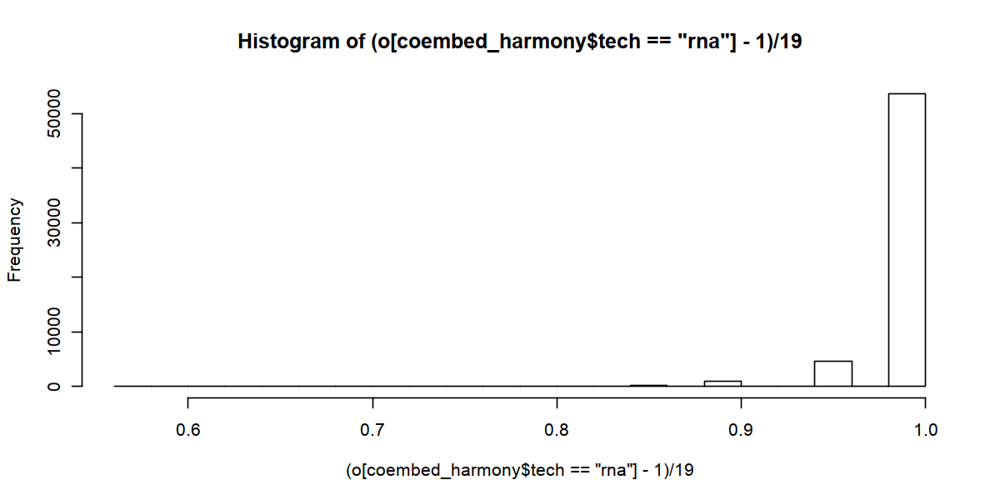

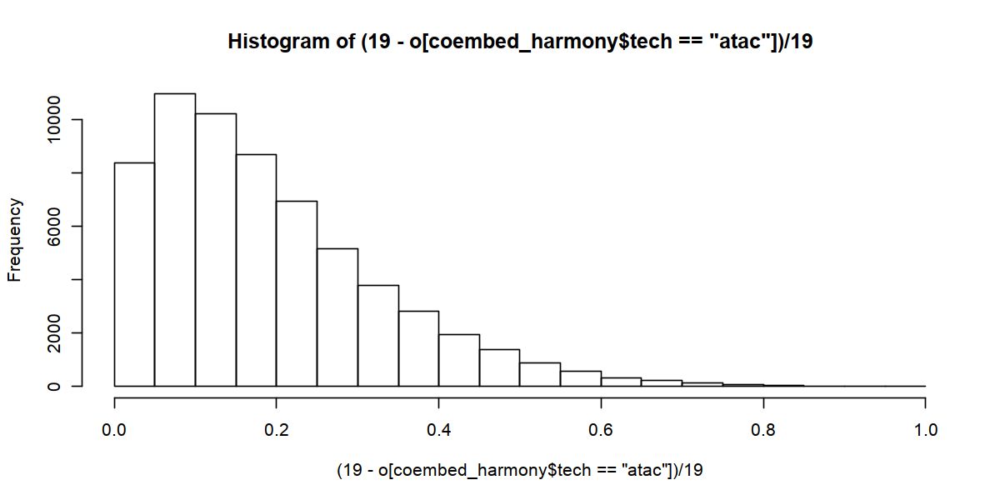

In [198]:
# fraction of kNN for RNA and ATAC that are the same type
options(repr.plot.width = 10, repr.plot.height = 5)

hist((o[coembed_harmony$tech=="rna"]-1)/19) 
hist((19-o[coembed_harmony$tech=="atac"])/19)

In [110]:
# sample names if missing
coembed_harmony$sample = as.vector(unlist(ifelse(is.na(coembed_harmony$sample), lapply(strsplit(colnames(coembed_harmony), "_"), "[[", 1), coembed_harmony$sample)))

In [166]:
coembed_harmony <- RunUMAP(coembed_harmony, reduction = "harmony", dims=1:30)

06:58:38 UMAP embedding parameters a = 0.9922 b = 1.112

06:58:38 Read 121977 rows and found 30 numeric columns

06:58:38 Using Annoy for neighbor search, n_neighbors = 30

06:58:38 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*

|

06:59:01 Writing NN index file to temp file /tmp/Rtmp3iUyo6/file2f8ec6372abc80

06:59:01 Searching Annoy index using 1 thread, search_k = 3000

07:00:18 Annoy recall = 100%

07:00:19 Commencing smooth kNN distance calibration using 1 thread

07:00:27 Initializing from normalized Laplacian + noise

07:00:33 Commencing optimization for 200 epochs, with 5656720 positive edges

07:02:01 Optimization finished



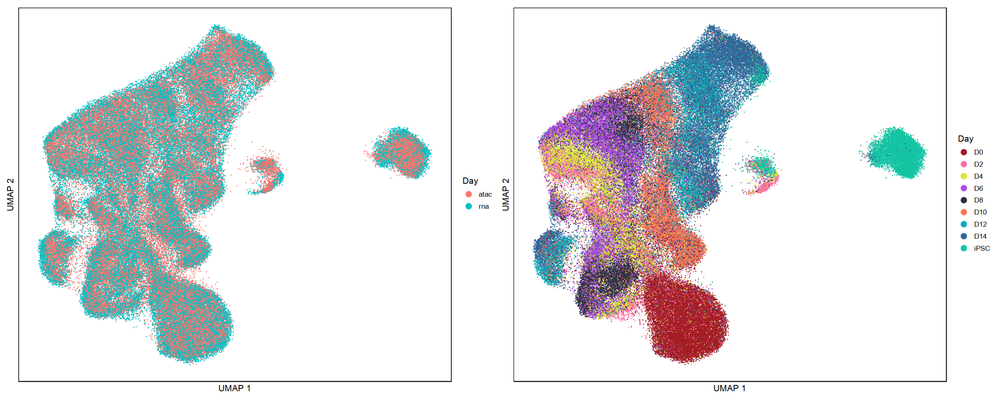

In [167]:
options(repr.plot.width = 20, repr.plot.height = 8)

plot_dimred(-data.frame(Embeddings(coembed_harmony, reduction='umap'))$UMAP_1,
            -data.frame(Embeddings(coembed_harmony, reduction='umap'))$UMAP_2,
            coembed_harmony@meta.data$tech) |
plot_dimred(-data.frame(Embeddings(coembed_harmony, reduction='umap'))$UMAP_1,
            -data.frame(Embeddings(coembed_harmony, reduction='umap'))$UMAP_2,
            factor(coembed_harmony$sample, levels=DAYS)) + scale_color_manual(values=as.character(day_config$colour)) 

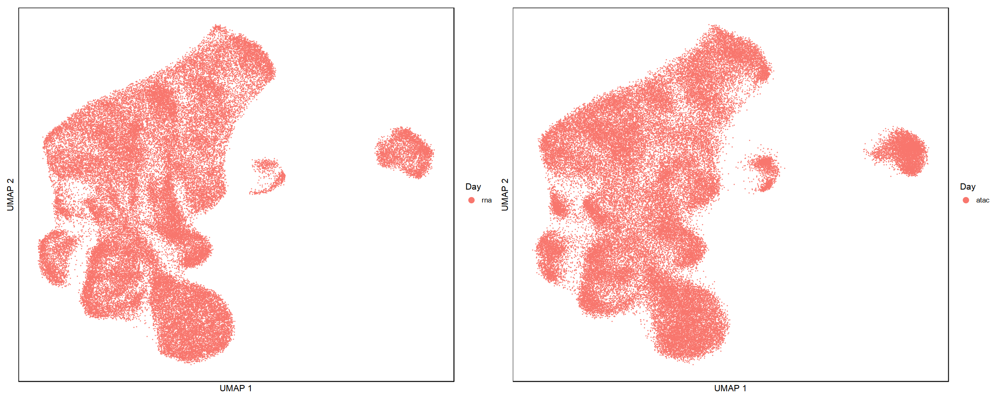

In [140]:
options(repr.plot.width = 20, repr.plot.height = 8)

plot_dimred(-data.frame(Embeddings(coembed_harmony, reduction='umap'))$UMAP_1,
            -data.frame(Embeddings(coembed_harmony, reduction='umap'))$UMAP_2,
            coembed_harmony@meta.data$tech, subset="rna") | 
plot_dimred(-data.frame(Embeddings(coembed_harmony, reduction='umap'))$UMAP_1,
            -data.frame(Embeddings(coembed_harmony, reduction='umap'))$UMAP_2,
            coembed_harmony@meta.data$tech, subset="atac")

## CCA Nearest Neighbours

In [141]:
library(RANN)

In [142]:
atac_cca = coembed_harmony@reductions$harmony@cell.embeddings[coembed_harmony$tech=='atac',1:30]
rna_cca = coembed_harmony@reductions$harmony@cell.embeddings[coembed_harmony$tech=='rna',1:30]

In [143]:
atac_2_rna_nn = nn2(rna_cca, query=atac_cca, 10)

In [144]:
SEL = c(46000)

In [149]:
SEL = which(atac.seurat$clusters_new_id %in% c(11,12,13,14))

In [150]:
RSEL = atac_2_rna_nn$nn.idx[SEL, 1]

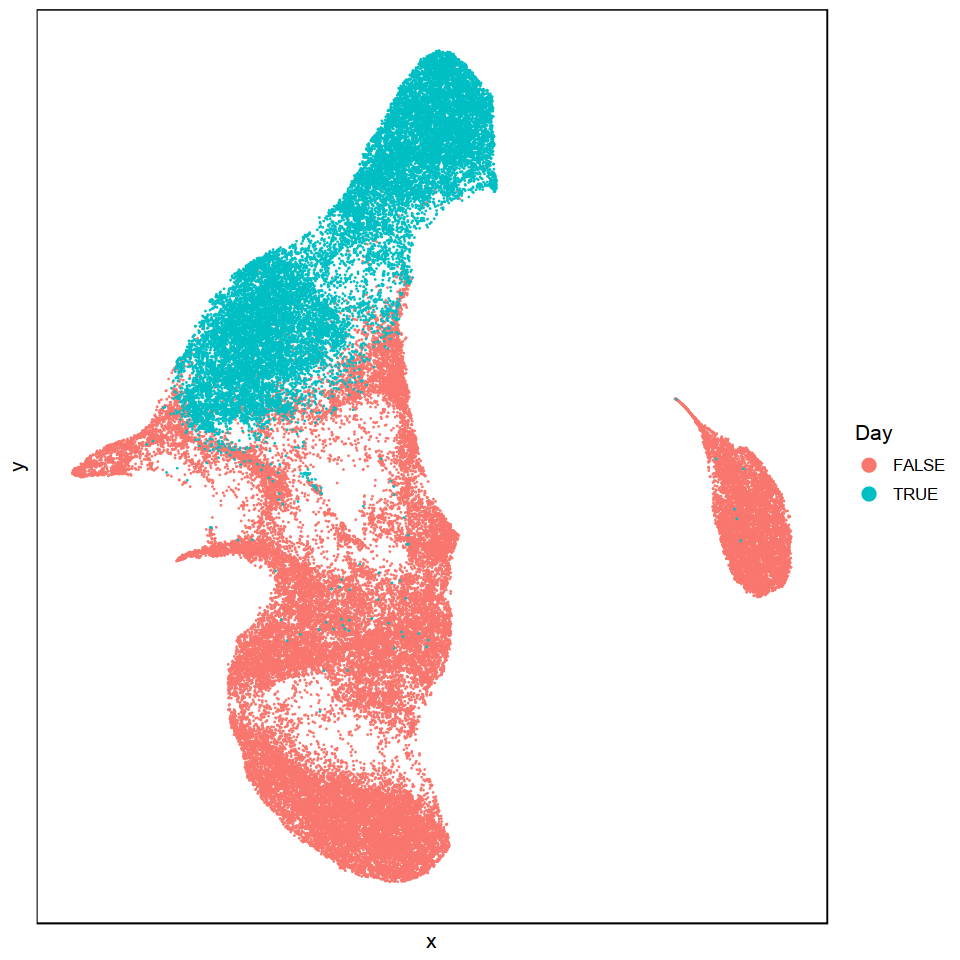

In [151]:
options(repr.plot.width = 8, repr.plot.height = 8)

# cur_pst = pst[,1]
# cur_pst[-SEL] = min(cur_pst[SEL])

plot_df <- data.frame(x=data.frame(Embeddings(atac.seurat, reduction='umap'))$umap_1, 
                      y=data.frame(Embeddings(atac.seurat, reduction='umap'))$umap_2,
                 cluster=seq(ncol(atac.seurat)) %in% SEL)

plot_df = plot_df[sample(dim(plot_df)[1]), ]
plot_df = plot_df[order(plot_df$cluster), ]

ggplot(plot_df) +
geom_point(aes(x=x, y=y, color=cluster, 
#                    size=ifelse(cluster, .1, 0.1)
              ), 
           stroke=0,
          size=0.5) +
theme_classic() +
theme(plot.title = element_text(hjust = 0.5),
      text = element_text(size=12),
      axis.line=element_blank(),
      axis.text.x=element_blank(),
      axis.text.y=element_blank(),
      axis.ticks=element_blank(),
      panel.border = element_rect(colour = "black", fill=NA, size=0.5)) +
guides(colour = guide_legend(title="Day",
     override.aes = list(shape=16, alpha=1, size=4)))

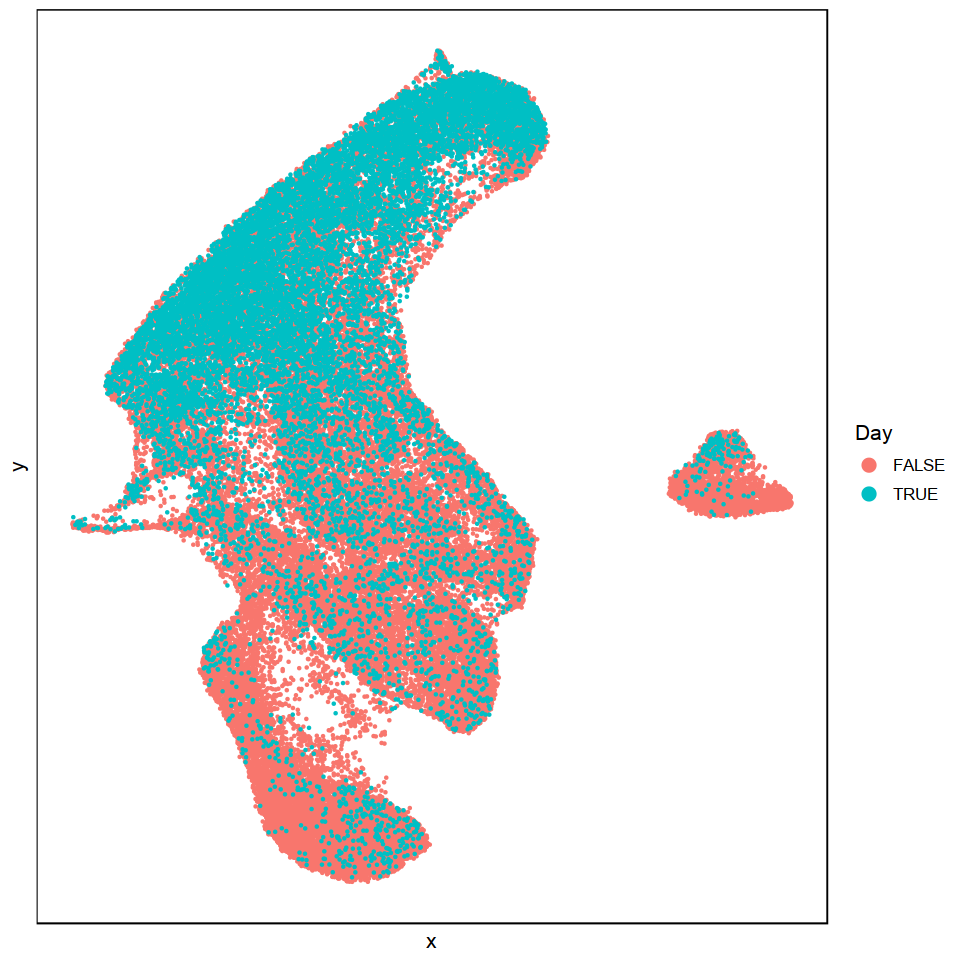

In [152]:
options(repr.plot.width = 8, repr.plot.height = 8)


plot_df <- data.frame(x=data.frame(Embeddings(rna, reduction='umap'))$UMAP_1, 
                      y=data.frame(Embeddings(rna, reduction='umap'))$UMAP_2,
                 cluster=seq(ncol(rna)) %in% RSEL)

plot_df = plot_df[sample(dim(plot_df)[1]), ]
plot_df = plot_df[order(plot_df$cluster), ]

ggplot(plot_df) +
geom_point(aes(x=x, y=y, color=cluster, 
#                    size=ifelse(cluster, .5, 0.1)
              ), 
           size=1,
           stroke=0) +
theme_classic() +
theme(plot.title = element_text(hjust = 0.5),
      text = element_text(size=12),
      axis.line=element_blank(),
      axis.text.x=element_blank(),
      axis.text.y=element_blank(),
      axis.ticks=element_blank(),
      panel.border = element_rect(colour = "black", fill=NA, size=0.5)) +
guides(colour = guide_legend(title="Day",
     override.aes = list(shape=16, alpha=1, size=4)))

In [195]:
# write CCA matrix
# for RNA barcodes are <barcode>-[1..8]
# for ATAC barcodes are D{X}_<barcode>
df_to_write = data.frame(tech=coembed_harmony$tech,
                         coembed_harmony@reductions$harmony@cell.embeddings[,1:30])

write.table(df_to_write,
           "./sessions/20210725_n59378/atac.20210717_n62599.harmony.cca.feat.tsv",
           quote=F,
            sep='\t',
           row.names=T,
           col.names=T)

Colour by state

In [194]:
# or load from existing saved file
atac.rna.label = read.table("../../analysis/20200828_RNA_Seurat/sessions/20210725_n59378/atac.20210717_n62599.cluster.transfer.tsv",
                           header=T)
rownames(atac.rna.label) = atac.rna.label$barcode
atac.rna.label$barcode = NULL

all(rownames(atac.rna.label)==colnames(rna))

# transfer to new cluster
atac.rna.label$atac_new_cluster = cluster_config[atac.rna.label$atac_cluster, "new_cluster"]

head(atac.rna.label)

coembed$atac_celltype <- as.numeric(c(atac.rna.label$atac_new_cluster, atac.seurat$clusters_new_id))
coembed_harmony$atac_celltype <- as.numeric(c(atac.rna.label$atac_new_cluster, atac.seurat$clusters_new_id))

[1] TRUE

,sample,atac_cluster,atac_new_cluster
,<fct>,<int>,<int>
AAACCCAAGAGTGACC-1,D0,1,1
AAACCCAAGTGCCAGA-1,D0,1,1
AAACCCACACCATTCC-1,D0,1,1
AAACCCACACGCGTCA-1,D0,1,1
AAACCCAGTCCATAGT-1,D0,1,1
AAACCCAGTTATTCTC-1,D0,1,1


In [168]:
coembed_harmony

An object of class Seurat 
54094 features across 121977 samples within 3 assays 
Active assay: RNA (29165 features, 0 variable features)
 2 other assays present: ACTIVITY, ATAC
 4 dimensional reductions calculated: pca, umap, cca, harmony

In [186]:
df_to_write = as.data.frame(-Embeddings(coembed_harmony, reduction='umap'))
df_to_write$tech = coembed_harmony$tech
df_to_write$sample = coembed_harmony$sample
df_to_write$new_cluster = coembed_harmony$atac_celltype

In [187]:
head(df_to_write)

,UMAP_1,UMAP_2,tech,sample,new_cluster
,<dbl>,<dbl>,<chr>,<chr>,<dbl>
AAACCCAAGAGTGACC-1,1.2965476,-6.107230,rna,D0,1
AAACCCAAGTGCCAGA-1,0.4220583,-6.520695,rna,D0,1
AAACCCACACCATTCC-1,0.5383412,-5.093749,rna,D0,1
AAACCCACACGCGTCA-1,0.6152854,-5.612450,rna,D0,1
AAACCCAGTCCATAGT-1,1.7165230,-4.596422,rna,D0,1
AAACCCAGTTATTCTC-1,-0.5278580,-4.510498,rna,D0,1


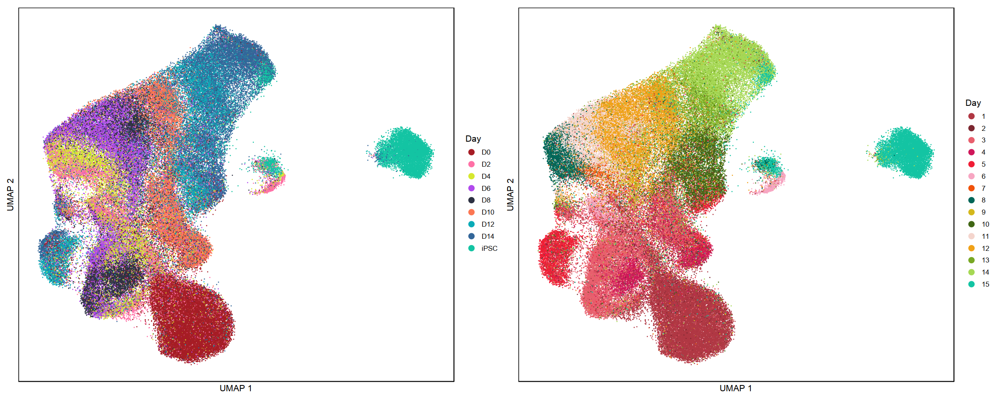

In [161]:
options(repr.plot.width = 20, repr.plot.height = 8)

plot_dimred(-data.frame(Embeddings(coembed_harmony, reduction='umap'))$UMAP_1,
            -data.frame(Embeddings(coembed_harmony, reduction='umap'))$UMAP_2,
            factor(coembed_harmony$sample, levels=DAYS)) + scale_color_manual(values=as.character(day_config$colour)) |
plot_dimred(-data.frame(Embeddings(coembed_harmony, reduction='umap'))$UMAP_1,
            -data.frame(Embeddings(coembed_harmony, reduction='umap'))$UMAP_2,
            factor(coembed_harmony$atac_celltype)) + scale_color_manual(values=as.character(cluster_config$colour)[order(cluster_config$new_cluster)]) 

In [183]:
head(df_to_write)

,UMAP_1,UMAP_2,tech,sample,new_cluster
,<dbl>,<dbl>,<chr>,<chr>,<dbl>
AAACCCAAGAGTGACC-1,-1.2965476,6.107230,rna,D0,1
AAACCCAAGTGCCAGA-1,-0.4220583,6.520695,rna,D0,1
AAACCCACACCATTCC-1,-0.5383412,5.093749,rna,D0,1
AAACCCACACGCGTCA-1,-0.6152854,5.612450,rna,D0,1
AAACCCAGTCCATAGT-1,-1.7165230,4.596422,rna,D0,1
AAACCCAGTTATTCTC-1,0.5278580,4.510498,rna,D0,1


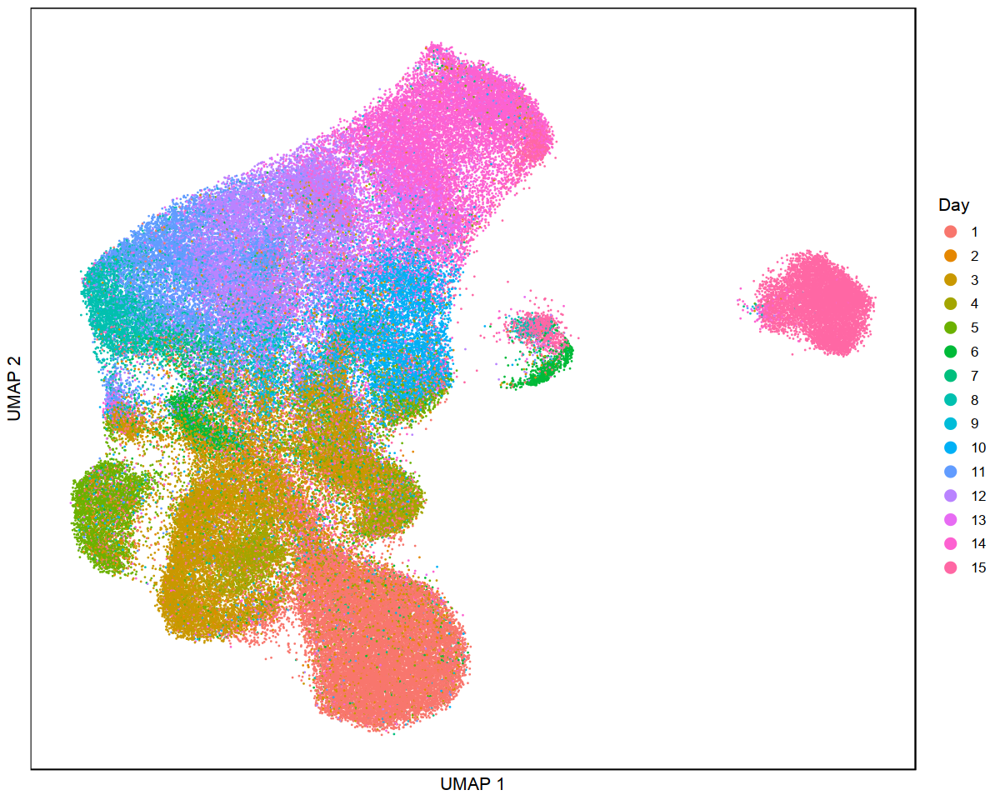

In [191]:
options(repr.plot.width = 10, repr.plot.height = 8)

plot_dimred(df_to_write$UMAP_1,
            df_to_write$UMAP_2,
            factor(df_to_write$new_cluster))

In [192]:
write.table(df_to_write,
           "./sessions/20210725_n59378/atac.20210717_n62599.harmony.cca.metadata.tsv",
           quote=F,
            sep='\t',
           row.names=T,
           col.names=T)

---

In [182]:
sessionInfo()

R version 3.6.3 (2020-02-29)
Platform: x86_64-conda_cos6-linux-gnu (64-bit)
Running under: Ubuntu 18.04.5 LTS

Matrix products: default
BLAS/LAPACK: /users/surag/anaconda3/envs/r36_cran/lib/libopenblasp-r0.3.9.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] parallel  stats4    stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] RANN_2.6.1                        harmony_1.0                      
 [3] Rcpp_1.0.5                        BSgenome.Hsapiens.UCSC.hg38_1.4.1
 [5] BSgenome_1.54.0                   Biostrings_2.54.0                
 [7] XVector_0.26.0                    ArchR_1.0.1      